In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

In [2]:
data = pd.read_csv("./data/MNIST.csv")

In [3]:
data.head(5)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
data.shape

(42000, 785)

In [5]:
# We have 28X28 matrix & one target
28*28+1

785

In [6]:
# All the pixels are features . 1st column is target

In [7]:
data.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
24350,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


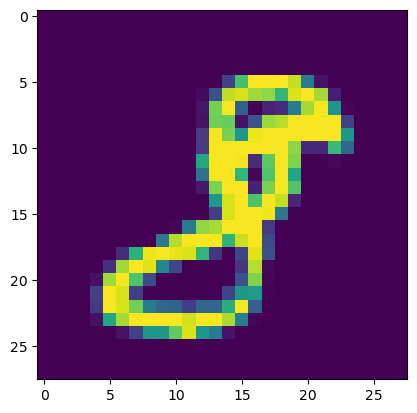

In [8]:
plt.imshow(data.iloc[22565,1:].values.reshape(28,28))

In [9]:
#type(data.iloc[0,:].values)

In [10]:
X = data.iloc[:,1:]
y = data.iloc[:,0]

In [11]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=101)

In [12]:
X_train.shape, X_test.shape

((33600, 784), (8400, 784))

In [13]:
from sklearn.neighbors import KNeighborsClassifier

In [14]:
# Using KNN we are trying to find which all images are similar.
# We are trying to calculate distance of each image from rest of the images to find out similar images.
# Using similar images we will get its target or label
knn = KNeighborsClassifier()

In [15]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [16]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time()-start)

5.087901592254639


In [17]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.9678571428571429

# Now Using PCA

Now we will use PCA that will reduce columns. But we will try to get same accuracy

In [18]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [19]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

In [20]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=100)

In [21]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [22]:
X_train.shape

(33600, 784)

In [23]:
knn = KNeighborsClassifier()

In [24]:
knn.fit(X_train_trf, y_train)

KNeighborsClassifier()

In [25]:
y_pred = knn.predict(X_test_trf)

In [26]:
accuracy_score(y_test, y_pred)

0.9557142857142857

In [27]:
import time
start = time.time()

accuracy = []
for i in range(1,785):
    pca = PCA(n_components = i,)
    X_train_trf = pca.fit_transform(X_train,)
    X_test_trf = pca.transform(X_test)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_trf, y_train)
    y_pred = knn.predict(X_test_trf)
    accuracy.append(accuracy_score(y_test, y_pred))
    #print(i)
    #print(accuracy_score(y_test, y_pred))
    #print()

print(time.time()-start)

1860.721356868744


# Visualization - PCA

In [28]:
pca = PCA(n_components = 2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [30]:
X_train_trf

array([[ 3.18208028, 17.21549132],
       [-6.87044159,  4.12186041],
       [-6.29908113, -2.35699229],
       ...,
       [-1.81021413,  7.64760786],
       [-7.3379972 ,  1.32016846],
       [ 1.25276867, 13.01209648]])

In [31]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x = X_train_trf[:,0],
                y = X_train_trf[:,1],
                color = y_train_trf,
                color_discrete_sequence = px.colors.qualitative.G10)
fig.show()

In [32]:
# For 3D
pca = PCA(n_components = 3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
X_train_trf

In [33]:
# For 3d
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(x = X_train_trf[:,0],
                y = X_train_trf[:,1],
                z = X_train_trf[:,2],
                color = y_train_trf,
                color_discrete_sequence = px.colors.qualitative.G10)
fig.update_layout(
margin = dict(l=20, r=20, t=20, b=20)
)
fig.show()

In [35]:
# Eigen Values
pca.explained_variance_

array([40.62691721, 29.16566986, 26.66708675])

In [36]:
# Eigen Vectors
pca.components_

array([[-3.49649227e-18,  1.27279554e-18,  2.17421239e-19, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 5.10080704e-17, -3.78442222e-18,  5.40548422e-19, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 1.98786619e-17,  3.27685906e-17,  9.96752278e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]])

In [37]:
pca.components_.shape

(3, 784)

In [38]:
pca.explained_variance_ratio_

array([0.05762512, 0.04136851, 0.03782453])

In [40]:
pca = PCA(n_components = None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [41]:
pca.explained_variance_.shape

(784,)

In [42]:
pca.components_.shape

(784, 784)

In [43]:
pca.explained_variance_ratio_

array([5.76251178e-02, 4.13685133e-02, 3.78245308e-02, 2.95725223e-02,
       2.56467636e-02, 2.23563927e-02, 1.95181462e-02, 1.77734881e-02,
       1.56730720e-02, 1.42959082e-02, 1.36976989e-02, 1.23352356e-02,
       1.14789186e-02, 1.12479566e-02, 1.04928591e-02, 1.01586929e-02,
       9.48018385e-03, 9.45779194e-03, 9.12335028e-03, 8.93556519e-03,
       8.43255381e-03, 8.20446896e-03, 7.86672860e-03, 7.57820010e-03,
       7.30372285e-03, 7.09639456e-03, 6.94734470e-03, 6.71151458e-03,
       6.37214853e-03, 6.25278201e-03, 6.20971953e-03, 6.00332263e-03,
       5.84254791e-03, 5.76750477e-03, 5.69455206e-03, 5.53208786e-03,
       5.46097307e-03, 5.29793893e-03, 5.05272238e-03, 4.96864109e-03,
       4.86866137e-03, 4.79532609e-03, 4.64555941e-03, 4.62584798e-03,
       4.57130688e-03, 4.49922031e-03, 4.46575504e-03, 4.40656253e-03,
       4.39888914e-03, 4.26753691e-03, 4.19292217e-03, 4.10374678e-03,
       4.08188175e-03, 3.99010866e-03, 3.95440433e-03, 3.88294709e-03,
      

In [45]:
csum = np.cumsum(pca.explained_variance_ratio_)
csum

array([0.05762512, 0.09899363, 0.13681816, 0.16639068, 0.19203745,
       0.21439384, 0.23391199, 0.25168547, 0.26735855, 0.28165446,
       0.29535215, 0.30768739, 0.31916631, 0.33041426, 0.34090712,
       0.35106582, 0.360546  , 0.37000379, 0.37912714, 0.38806271,
       0.39649526, 0.40469973, 0.41256646, 0.42014466, 0.42744838,
       0.43454478, 0.44149212, 0.44820364, 0.45457578, 0.46082857,
       0.46703829, 0.47304161, 0.47888416, 0.48465166, 0.49034621,
       0.4958783 , 0.50133927, 0.50663721, 0.51168994, 0.51665858,
       0.52152724, 0.52632256, 0.53096812, 0.53559397, 0.54016528,
       0.5446645 , 0.54913025, 0.55353682, 0.55793571, 0.56220324,
       0.56639616, 0.57049991, 0.57458179, 0.5785719 , 0.58252631,
       0.58640925, 0.59022101, 0.59397439, 0.59771808, 0.60138366,
       0.60494101, 0.60846367, 0.61193733, 0.6153717 , 0.61877238,
       0.62215925, 0.62546677, 0.62870571, 0.63190478, 0.63505823,
       0.63819645, 0.64129935, 0.64435948, 0.6473982 , 0.65038

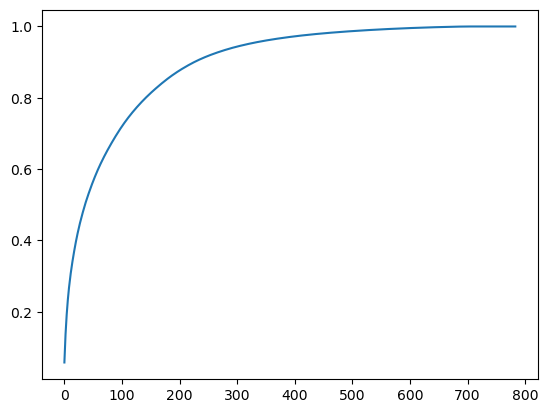

In [46]:
# We should look for 90% variance
plt.plot(csum)